# AT1A - Experiment univariate linear regression

In [1]:
# importing pandas library to read and modify the dataset
import pandas as pd
# Do not want to print the warning, so ignoring them
import warnings
warnings.filterwarnings('ignore')

### 1. Reading the dataset

In [39]:
# reading train and test file of the cancer mortality dataset
cancer_data_train = pd.read_csv("cancer_us_county-training.csv")
cancer_data_test = pd.read_csv("cancer_us_county-testing.csv")

In [40]:
# checking the size of the data
print(cancer_data_train.shape)
print(cancer_data_test.shape)

(2438, 35)
(609, 35)


In [41]:
# printing a sample of 5 rows from the data
cancer_data_train.sample(5)

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
2240,697.000000,222,157.3,483.700000,58368,149039,11.1,6.709653,"(54545.6, 61494.5]",36.9,...,52.0,26.8,13.0,77.111767,19.689154,1.223758,0.673203,54.323420,4.718441,2801
1458,61.000000,24,164.7,439.700000,41304,8496,16.6,0.000000,"(40362.7, 42724.4]",50.2,...,30.0,45.1,19.1,94.042056,0.163551,0.443925,0.759346,54.550439,6.401766,1815
2303,61.000000,25,187.8,515.100000,42007,6867,17.0,0.000000,"(40362.7, 42724.4]",52.4,...,36.6,42.9,17.6,87.054735,1.129453,0.796409,1.419056,46.809200,6.163753,2881
804,1962.667684,126,166.5,453.549422,65549,79315,10.9,0.000000,"(61494.5, 125635]",37.3,...,42.7,26.7,10.6,83.885359,8.462551,1.574904,1.127488,56.929749,5.174511,1027
153,62.000000,24,178.8,475.700000,41348,11539,19.0,0.000000,"(40362.7, 42724.4]",40.1,...,37.4,39.7,26.3,87.079280,9.830421,0.034432,0.025824,51.360701,5.545148,196


In [42]:
# Dropping Id as it is of no use
cancer_data_train = cancer_data_train.drop(columns=["Id"])

In [43]:
# check the Minimum deathrate in train set
cancer_data_train.loc[:,"TARGET_deathRate"].min()

66.3

In [44]:
# Maximum deathrate in train set
cancer_data_train.loc[:,"TARGET_deathRate"].max()

293.9

In [45]:
# Average deathrate
cancer_data_train.loc[:,"TARGET_deathRate"].mean()

178.84848236259228

### 2. Exploratory Data Analysis

In [46]:
# Check for Null values in the train set - percentage wise
cancer_data_train.isnull().mean() * 100

avgAnnCount                 0.000000
avgDeathsPerYear            0.000000
TARGET_deathRate            0.000000
incidenceRate               0.000000
medIncome                   0.000000
popEst2015                  0.000000
povertyPercent              0.000000
studyPerCap                 0.000000
binnedInc                   0.000000
MedianAge                   0.000000
MedianAgeMale               0.000000
MedianAgeFemale             0.000000
Geography                   0.000000
AvgHouseholdSize            0.000000
PercentMarried              0.000000
PctNoHS18_24                0.000000
PctHS18_24                  0.000000
PctSomeCol18_24            74.897457
PctBachDeg18_24             0.000000
PctHS25_Over                0.000000
PctBachDeg25_Over           0.000000
PctEmployed16_Over          5.004102
PctUnemployed16_Over        0.000000
PctPrivateCoverage          0.000000
PctPrivateCoverageAlone    20.508614
PctEmpPrivCoverage          0.000000
PctPublicCoverage           0.000000
P

### Columns with null values
1. PctSomeCol18_24 - has the highest percentage of null values i.e 74.89%
2. PctPrivateCoverageAlone - 20.50%
3. PctEmployed16_Over -  5%

In [47]:
# Defining a function to get null values from the dataframe and store it in a dictionary
def get_null_vals(df):
    null_vals = dict(sorted(df.isna().sum().to_dict().items(), key=lambda item: item[1], reverse=True))
    return null_vals

In [48]:
# define a function to plot a bar graph to show the null values count
# importing graph_objects and offline sub-package from plotly library
import plotly.graph_objects as go

def plot_null_vals(X, Y):
    fig = go.Figure(data = go.Bar(x=X, y=Y, marker={"color":[1, 2, 3, 4, 5,6,7]}))
    fig.show()

In [49]:
""""import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()"""

'"import plotly.offline as pyo\n# Set notebook mode to work in offline\npyo.init_notebook_mode()'

In [50]:
import plotly.io as pio
pio.renderers.default='notebook'

In [51]:
# calling the get_null_vals function 
null_vals = get_null_vals(cancer_data_train)
X = list(null_vals.keys())
Y = list(null_vals.values())
plot_null_vals(X,Y)

<b> Plotting blox plot and distribution graph to analyse the scattering of data points in two columns viz. PctPrivateCoverageAlone and PctEmployed16_Over in order to handle the missing values in them.</b>

<Axes: >

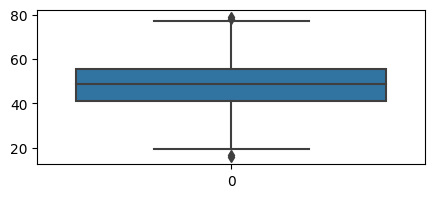

In [13]:
# importing matplotlip and seaborn libraries to plot visualization graphs
import matplotlib.pyplot as plt
import seaborn as sns

# fixing the figure size
fig, ax = plt.subplots(figsize= (5, 2)) 
# plotting boxplot via seaborn
sns.boxplot(cancer_data_train.PctPrivateCoverageAlone)

<Axes: xlabel='PctPrivateCoverageAlone', ylabel='Density'>

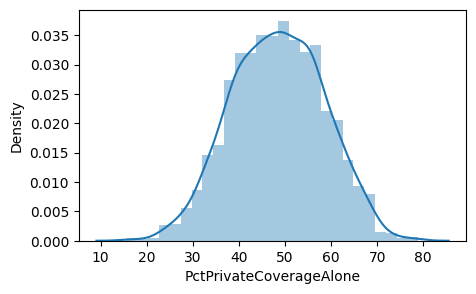

In [14]:
fig, ax = plt.subplots(figsize= (5, 3))
# plotting distribution graph 
sns.distplot(cancer_data_train.PctPrivateCoverageAlone)

<Axes: >

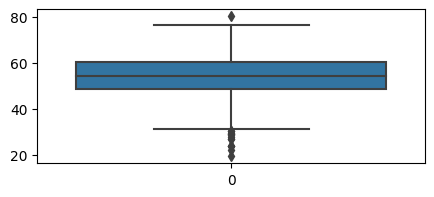

In [15]:
fig, ax = plt.subplots(figsize= (5, 2))
# boxplot for PctEmployed16_Over dataframe column
sns.boxplot(cancer_data_train.PctEmployed16_Over)

<Axes: xlabel='PctEmployed16_Over', ylabel='Density'>

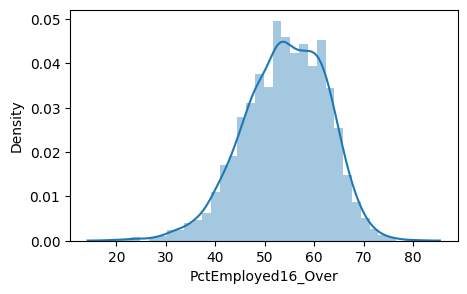

In [16]:
fig, ax = plt.subplots(figsize= (5, 3))
# plotting distribution graph 
sns.distplot(cancer_data_train.PctEmployed16_Over)

In [17]:
# PctSomeCol18_24 should be eliminated
cancer_data_train = cancer_data_train.drop('PctSomeCol18_24',axis=1)

#PctPrivateCoverageAlone has no skew and is normally distributed - can replace null with mean
cancer_data_train['PctPrivateCoverageAlone'] = cancer_data_train['PctPrivateCoverageAlone'].fillna(cancer_data_train['PctPrivateCoverageAlone'].mean())

#PctEmployed16_Over has outliers and is left skewed - replace null by median
cancer_data_train['PctEmployed16_Over'] = cancer_data_train['PctEmployed16_Over'].fillna(cancer_data_train['PctEmployed16_Over'].median())

In [ ]:
# check if the data has any null values left now
cancer_data_train.isnull().sum()

### Plotting scatter plots for each variable against the target death rate to analyse the relationship between them

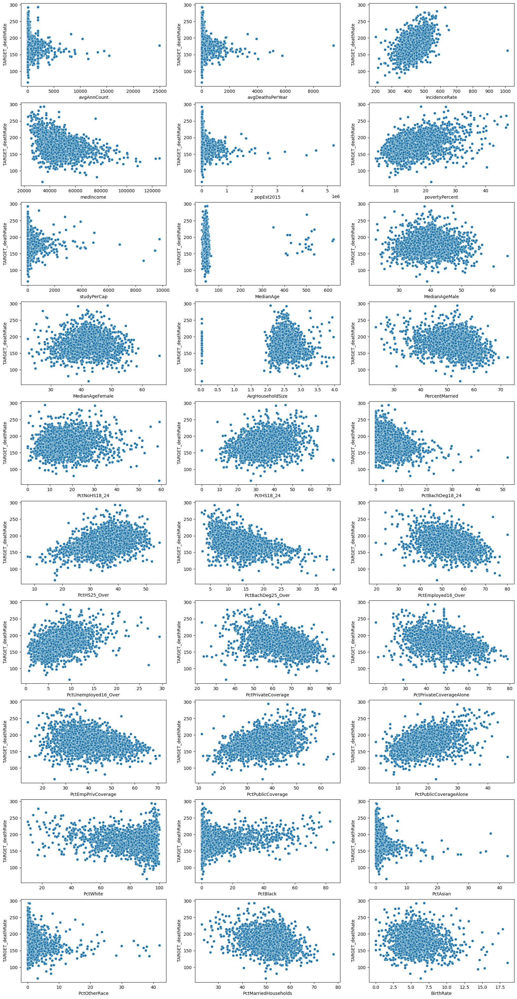

In [20]:
# importing math and numpy libraries
import math
import numpy as np

# num_data has all the nuerical columns 
num_data = cancer_data_train.select_dtypes(include=np.number) 

# fix axes to subplot the scatter plots
fig, ax = plt.subplots(nrows=10, ncols=3, figsize=(20, 40))

# pop the target variable to plot each variable against it 
target = num_data.pop("TARGET_deathRate")

#loop through each column and plot the scatter plot
for index, cols in enumerate(num_data.columns.values):
    sns.scatterplot(data = num_data,  y = target , x = cols , ax = ax[math.floor(index/3)][index%3])
plt.show()

### 3. Choosing two best features

### As we need to choose two best features to train univariate linear regression for each of them, we will perform Principal component Analysis to pick those two.

<b>Why PCA and not Correlation?</b> <br> 
We use Correlation analysis if the characteristics and the target variable exhibit strong, distinct linear or monotonic correlations. But as we can see from the scatter plots above, there are no such distinct relationships.
However, PCA analysis can be of help if they are not (completely) linearly related to the target variable (like us).

In [21]:
# importing PCA from scikit learn library
from sklearn.decomposition import PCA

# Create a dataframe with the independent variables
X = cancer_data_train.select_dtypes(include=np.number)
X = X.drop('TARGET_deathRate', axis=1)

# Create a PCA object with 2 components as we want to choose 2 best features
pca = PCA(n_components = 2)
# Fit and transform the PCA model on X
s = pca.fit_transform(X)
# find proportion of the total variance 
print(pca.explained_variance_ratio_)

[0.9982274  0.00176456]


In [22]:
print(pd.DataFrame(pca.components_.T, index=X.columns))

                                    0         1
avgAnnCount              4.072046e-03  0.005785
avgDeathsPerYear         1.554129e-03 -0.000626
incidenceRate            8.780608e-06 -0.000068
medIncome                1.083681e-02  0.999922
popEst2015               9.999318e-01 -0.010859
povertyPercent          -1.587806e-06 -0.000440
studyPerCap              1.254904e-04  0.001185
MedianAge               -4.073021e-06  0.000011
MedianAgeMale           -3.861688e-06 -0.000023
MedianAgeFemale         -3.940590e-06 -0.000053
AvgHouseholdSize         1.666641e-07  0.000003
PercentMarried          -4.736518e-06  0.000243
PctNoHS18_24            -4.084031e-06 -0.000186
PctHS18_24              -5.606866e-06 -0.000109
PctBachDeg18_24          4.674338e-06  0.000169
PctHS25_Over            -8.742330e-06 -0.000237
PctBachDeg25_Over        6.597671e-06  0.000293
PctEmployed16_Over       4.696515e-06  0.000466
PctUnemployed16_Over     6.465061e-07 -0.000146
PctPrivateCoverage       2.477163e-06  0

From the above PCA analysis, <b>medIncome, popEst2015</b> are the two features that contribute the most to the variability in the data.

### 4. Training univariate model - 1 [Feature = popEst2015] 

In [23]:
#import regression model from scikit learn library 
from sklearn.linear_model import LinearRegression 
reg1 = LinearRegression()

In [24]:
# reading dependent and independent variables from train & test dataset
X1_train = cancer_data_train['popEst2015'].values
y_train = cancer_data_train['TARGET_deathRate'].values

X1_test = cancer_data_test['popEst2015'].values
y_test = cancer_data_test['TARGET_deathRate'].values

<b> Note: We are not making a validation set out of the training set because here the train set is acting like validation as the target variable is given </b>

In [25]:
# Fitting regression line
reg1.fit(X1_train.reshape(-1, 1), y_train)  # reshape X into a 2D array

LinearRegression()

In [26]:
# importing mean squared error from scikit learn metrics
from sklearn.metrics import mean_squared_error as mse

# Calculating MSE for train set
y_train_pred1 = reg1.predict(X1_train.reshape(-1, 1))
print("Linear Regression (1) train MSE:", mse(y_train, y_train_pred1, squared=True))

Linear Regression (1) train MSE: 746.2539927480362


In [27]:
# plotting scatter plot with the prediction line for train set
# importing altair library
import altair as alt
line_chart = alt.Chart(pd.DataFrame({'x': X1_train, 'y': y_train_pred1})).mark_line().encode(
    x='x',
    y='y'
  )

scatter_chart = alt.Chart(cancer_data_train).mark_circle(size=60, color='orange').encode(
    x='popEst2015',
    y='TARGET_deathRate'
)

In [29]:
scatter_chart + line_chart

alt.LayerChart(...)

In [30]:
# Calculating MSE for test set
y_test_pred1 = reg1.predict(X1_test.reshape(-1, 1))
print("Linear Regression (1) test MSE:",mse(y_test, y_test_pred1, squared=True))

Linear Regression (1) test MSE: 812.174217566464


### 5. Training univariate model - 2 [Feature = medIncome] 

In [31]:
X2_train = cancer_data_train['medIncome'].values
X2_test = cancer_data_test['medIncome'].values

In [32]:
# Fitting regression line for medIncome
reg2 = LinearRegression()
reg2.fit(X2_train.reshape(-1, 1), y_train)

LinearRegression()

In [33]:
# Calculating MSE for train set
y_train_pred2 = reg2.predict(X2_train.reshape(-1, 1))
print("Linear Regression (2) train MSE:",mse(y_train, y_train_pred2, squared=True))

Linear Regression (2) train MSE: 613.2768369121617


In [34]:
# plotting scatter plot with the prediction line for train set
line_chart = alt.Chart(pd.DataFrame({'x': X2_train, 'y': y_train_pred2})).mark_line().encode(
    x='x',
    y='y'
  )

scatter_chart = alt.Chart(cancer_data_train).mark_circle(size=60, color='orange').encode(
    x='medIncome',
    y='TARGET_deathRate'
)

In [35]:
scatter_chart + line_chart

alt.LayerChart(...)

In [36]:
# Calculating MSE for test set
y_test_pred2 = reg2.predict(X2_test.reshape(-1, 1))
print("Linear Regression (2) test MSE:",mse(y_test, y_test_pred2, squared=True))

Linear Regression (2) test MSE: 689.6767309982113
